In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.preprocessing import MinMaxScaler
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# DATA PREPROCESSING

### Importing Datasets

In [2]:

import os, types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.

if os.environ.get('RUNTIME_ENV_LOCATION_TYPE') == 'external':
    endpoint_4b15fa3394a14800b00716fbf214f282 = 'https://s3.us.cloud-object-storage.appdomain.cloud'
else:
    endpoint_4b15fa3394a14800b00716fbf214f282 = 'https://s3.private.us.cloud-object-storage.appdomain.cloud'

client_4b15fa3394a14800b00716fbf214f282 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='UK9E4LhblYhtCOzQ9wMS3cP0ALg0Ne_Z_neaRkm7s5zn',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url=endpoint_4b15fa3394a14800b00716fbf214f282)

body = client_4b15fa3394a14800b00716fbf214f282.get_object(Bucket='predictenginefailures-donotdelete-pr-dzldltk75qmkfh',Key='df_train.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )
df_train = pd.read_csv(body)


body = client_4b15fa3394a14800b00716fbf214f282.get_object(Bucket='predictenginefailures-donotdelete-pr-dzldltk75qmkfh',Key='df_test.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )
df_test = pd.read_csv(body)


body = client_4b15fa3394a14800b00716fbf214f282.get_object(Bucket='predictenginefailures-donotdelete-pr-dzldltk75qmkfh',Key='df_true.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_truth = pd.read_csv(body)


In [3]:
print('Shape:',df_train.shape)
print(df_train.info())
df_train.head()

Shape: (20631, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine_id  20631 non-null  int64  
 1   cycle      20631 non-null  int64  
 2   setting1   20631 non-null  float64
 3   setting2   20631 non-null  float64
 4   setting3   20631 non-null  int64  
 5   s1         20631 non-null  float64
 6   s2         20631 non-null  float64
 7   s3         20631 non-null  float64
 8   s4         20631 non-null  float64
 9   s5         20631 non-null  float64
 10  s6         20631 non-null  float64
 11  s7         20631 non-null  float64
 12  s8         20631 non-null  float64
 13  s9         20631 non-null  float64
 14  s10        20631 non-null  float64
 15  s11        20631 non-null  float64
 16  s12        20631 non-null  float64
 17  s13        20631 non-null  float64
 18  s14        20631 non-null  float64
 19  s15        20631 non-null  

,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044


In [4]:
print('Shape:',df_test.shape)
print(df_test.info())
df_test.head()

Shape: (13096, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 26 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine_id  13096 non-null  int64  
 1   cycle      13096 non-null  int64  
 2   setting1   13096 non-null  float64
 3   setting2   13096 non-null  float64
 4   setting3   13096 non-null  int64  
 5   s1         13096 non-null  float64
 6   s2         13096 non-null  float64
 7   s3         13096 non-null  float64
 8   s4         13096 non-null  float64
 9   s5         13096 non-null  float64
 10  s6         13096 non-null  float64
 11  s7         13096 non-null  float64
 12  s8         13096 non-null  float64
 13  s9         13096 non-null  float64
 14  s10        13096 non-null  float64
 15  s11        13096 non-null  float64
 16  s12        13096 non-null  float64
 17  s13        13096 non-null  float64
 18  s14        13096 non-null  float64
 19  s15        13096 non-null  

,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,0.0023,0.0003,100,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100,38.86,23.3735
1,1,2,-0.0027,-0.0003,100,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100,39.02,23.3916
2,1,3,0.0003,0.0001,100,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100,39.08,23.4166
3,1,4,0.0042,0.0000,100,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100,39.00,23.3737
4,1,5,0.0014,0.0000,100,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100,38.99,23.4130


In [5]:
print('Shape:',df_truth.shape)
print(df_truth.info())
df_truth.head()

Shape: (100, 2)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   rem_cycles  100 non-null    int64
 1   engine_id   100 non-null    int64
dtypes: int64(2)
memory usage: 1.7 KB
None


,rem_cycles,engine_id
0,112,1
1,98,2
2,69,3
3,82,4
4,91,5


### PRE PROCESS THE DATASET

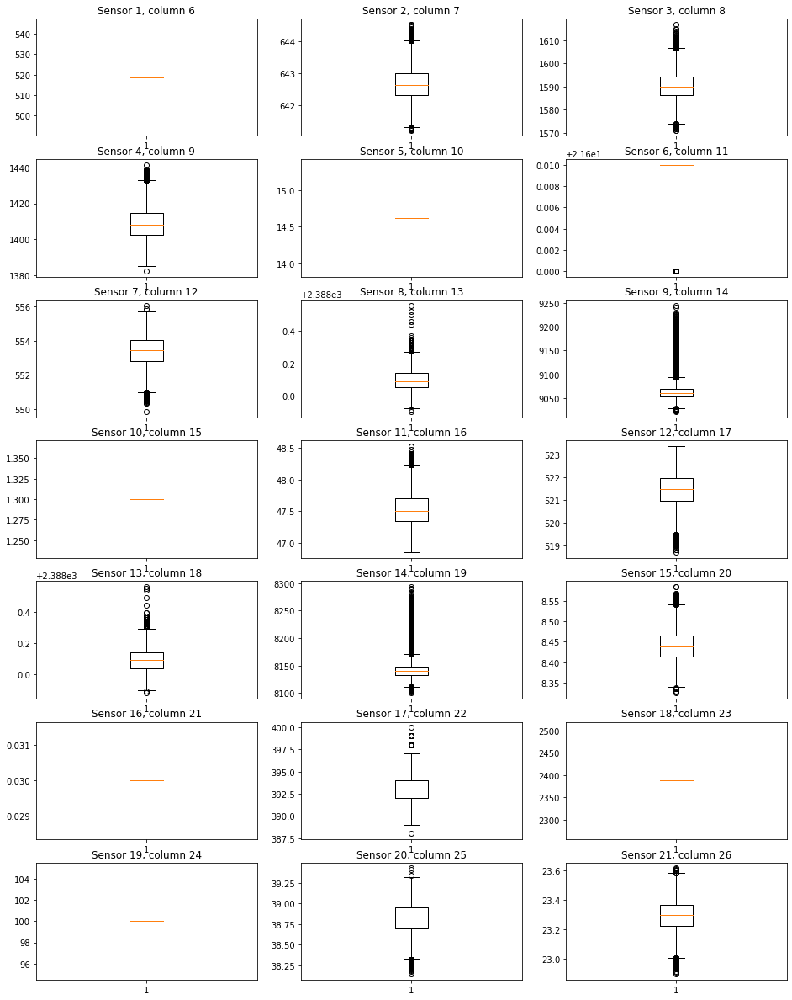

In [6]:
#Boxplots of sensor data
plt.figure(figsize = (16, 21))
for i in range(21):
    temp_data = df_train.iloc[:,i+5]
    plt.subplot(7,3,i+1)
    plt.boxplot(temp_data)
    plt.title("Sensor " + str(i+1) + ", column "+ str(i+6))
plt.show()

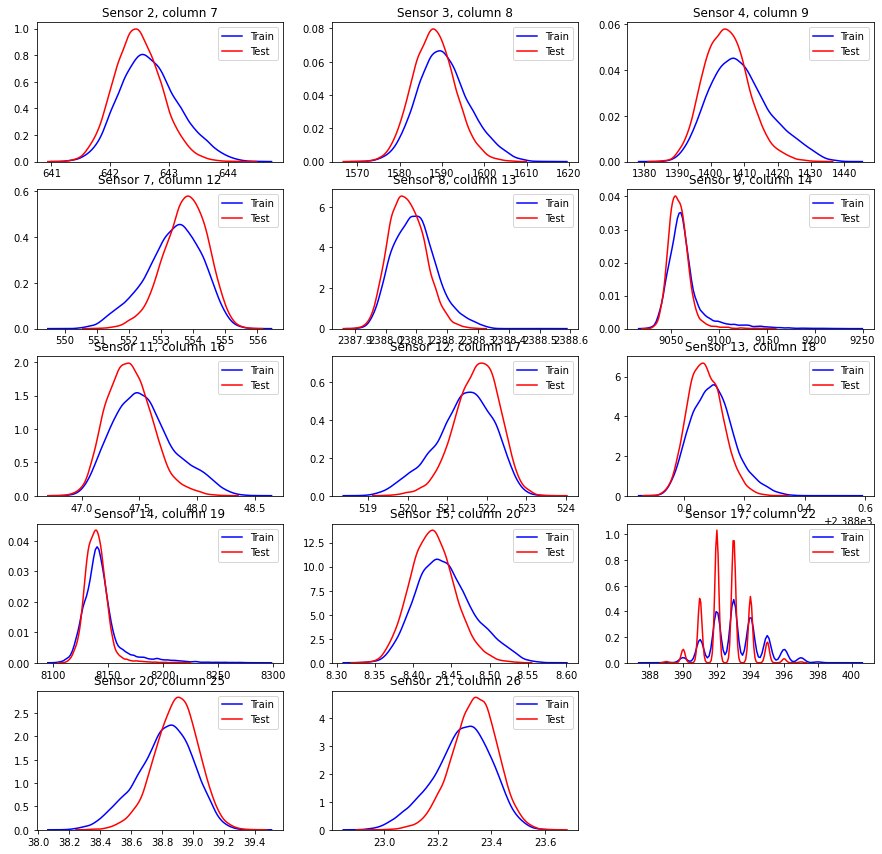

In [7]:
# comparision of train and test data
plt.figure(figsize = (15, 21))
for i,j in enumerate([6, 7, 8, 11, 12, 13, 15, 16, 17, 18, 19, 21, 24, 25]):
    temp_train = df_train.iloc[:, j]
    temp_test = df_test.iloc[:, j]
    plt.subplot(7,3, i+1)
    sns.kdeplot(temp_train, legend = False, color = "blue", label = "Train")
    sns.kdeplot(temp_test, legend = False, color = "red", label = "Test")
    plt.title("Sensor " + str(j-4) + ", column "+ str(j+1))
    plt.legend()
plt.show()

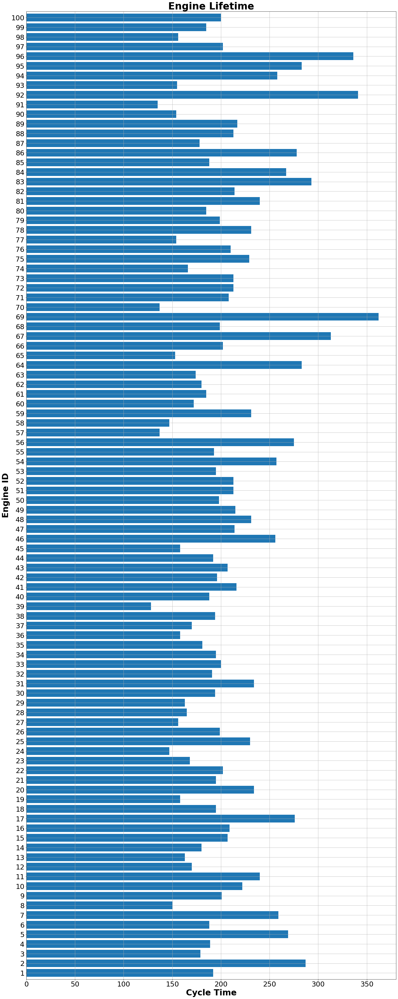

In [8]:
#plt.style.use('dark_background')
plt.figure(figsize=(20,50))
ax = df_train.groupby('engine_id')['cycle'].max().plot(kind='barh',width=0.8,stacked = True, align = 'center', rot = 0)
plt.title("Engine Lifetime", fontweight = 'bold', size = 35)
plt.xlabel('Cycle Time', fontweight='bold',size=30)
plt.xticks(size=25)
plt.ylabel('Engine ID',fontweight='bold',size=30)
plt.yticks(size=25)
plt.grid(True)
plt.tight_layout(True)
plt.show()

In [7]:
df_train.engine_id.unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100])

In [8]:
rul=pd.DataFrame(df_test.groupby('engine_id')['cycle'].max()).reset_index()
cols=['engine_id','max_cycles'] # maximum number of cycles performed by each engine
rul.columns=cols
print('Shape:',rul.shape)
rul

Shape: (100, 2)


,engine_id,max_cycles
0,1,31
1,2,49
2,3,126
3,4,106
4,5,98
...,...,...
95,96,97
96,97,134
97,98,121
98,99,97


Now rul and truth data have same dimensions

In [9]:
# calculating remaining time for failure for each engine
df_truth['rtf']=df_truth['rem_cycles']+rul['max_cycles']
print('Shape:',df_truth.shape)
df_truth.head()

Shape: (100, 3)


,rem_cycles,engine_id,rtf
0,112,1,143
1,98,2,147
2,69,3,195
3,82,4,188
4,91,5,189


In [10]:
df_truth.drop('rem_cycles', axis=1, inplace=True)
df_test=df_test.merge(df_truth,on=['engine_id'],how='left')
df_test['ttf']=df_test['rtf'] - df_test['cycle']
df_test.drop('rtf', axis=1, inplace=True)
print('Shape:',df_test.shape)
df_test.head()

Shape: (13096, 27)


,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,ttf
0,1,1,0.0023,0.0003,100,518.67,643.02,1585.29,1398.21,14.62,...,2388.03,8125.55,8.4052,0.03,392,2388,100,38.86,23.3735,142
1,1,2,-0.0027,-0.0003,100,518.67,641.71,1588.45,1395.42,14.62,...,2388.06,8139.62,8.3803,0.03,393,2388,100,39.02,23.3916,141
2,1,3,0.0003,0.0001,100,518.67,642.46,1586.94,1401.34,14.62,...,2388.03,8130.10,8.4441,0.03,393,2388,100,39.08,23.4166,140
3,1,4,0.0042,0.0000,100,518.67,642.44,1584.12,1406.42,14.62,...,2388.05,8132.90,8.3917,0.03,391,2388,100,39.00,23.3737,139
4,1,5,0.0014,0.0000,100,518.67,642.51,1587.19,1401.92,14.62,...,2388.03,8129.54,8.4031,0.03,390,2388,100,38.99,23.4130,138


In [11]:
df_train['ttf'] = df_train.groupby(['engine_id'])['cycle'].transform(max)-df_train['cycle']
print('Shape:',df_train.shape)
df_train.head()

Shape: (20631, 27)


,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,ttf
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187


In [12]:
df_train.ttf.value_counts()

0      100
123    100
121    100
89     100
73     100
      ... 
341      1
356      1
355      1
354      1
351      1
Name: ttf, Length: 362, dtype: int64

### Calculating Time to Failure

In [13]:
dfn_train=df_train.copy() # new train data
dfn_test=df_test.copy() # new test data
period=30 # threshold
dfn_train['label_bc'] = dfn_train['ttf'].apply(lambda x: 1 if x <= period else 0)
dfn_test['label_bc'] = dfn_test['ttf'].apply(lambda x: 1 if x <= period else 0)
print('For train data-')
print('min ttf:',dfn_train.ttf.min())
print('max ttf:',dfn_train.ttf.max())
print('mean ttf:',dfn_train.ttf.mean())
dfn_train.head()

For train data-
min ttf: 0
max ttf: 361
mean ttf: 107.80786195530997


,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,ttf,label_bc
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191,0
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190,0
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189,0
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188,0
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187,0


In [14]:
dfn_train.label_bc.value_counts()

0    17531
1     3100
Name: label_bc, dtype: int64

### Feature Scaling

In [15]:
features_col_name=['setting1', 'setting2', 'setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11',
                   's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
target_col_name='label_bc'
sc=MinMaxScaler()
dfn_train[features_col_name]=sc.fit_transform(dfn_train[features_col_name])
dfn_test[features_col_name]=sc.transform(dfn_test[features_col_name])
dfn_train.head()

,engine_id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,ttf,label_bc
0,1,1,0.459770,0.166667,0.0,0.0,0.183735,0.406802,0.309757,0.0,...,0.199608,0.363986,0.0,0.333333,0.0,0.0,0.713178,0.724662,191,0
1,1,2,0.609195,0.250000,0.0,0.0,0.283133,0.453019,0.352633,0.0,...,0.162813,0.411312,0.0,0.333333,0.0,0.0,0.666667,0.731014,190,0
2,1,3,0.252874,0.750000,0.0,0.0,0.343373,0.369523,0.370527,0.0,...,0.171793,0.357445,0.0,0.166667,0.0,0.0,0.627907,0.621375,189,0
3,1,4,0.540230,0.500000,0.0,0.0,0.343373,0.256159,0.331195,0.0,...,0.174889,0.166603,0.0,0.333333,0.0,0.0,0.573643,0.662386,188,0
4,1,5,0.390805,0.333333,0.0,0.0,0.349398,0.257467,0.404625,0.0,...,0.174734,0.402078,0.0,0.416667,0.0,0.0,0.589147,0.704502,187,0


[]

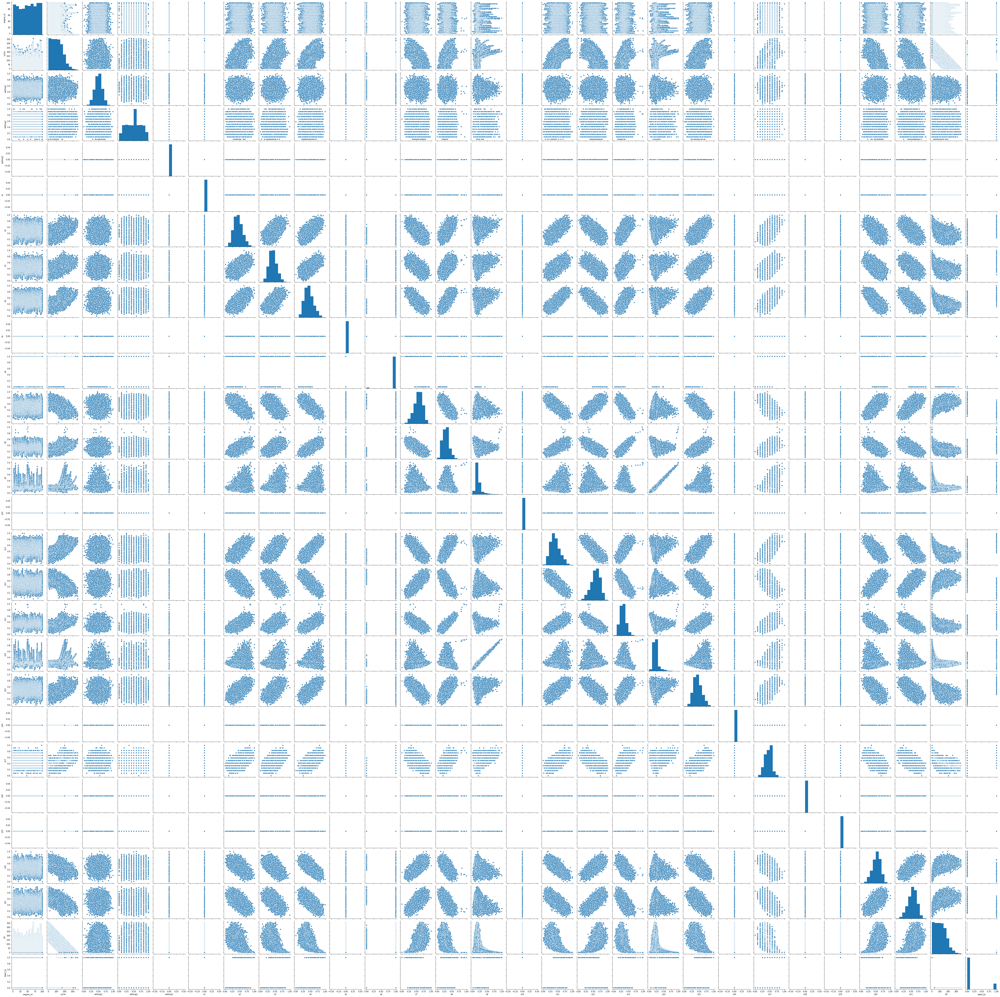

In [31]:
sns.pairplot(dfn_train)
plt.plot()
# Plotting pairwise relationships in a dataset.

### Splitting dependent and independent variables

In [16]:
x_train = dfn_train.iloc[:,:-1].values
y_train = dfn_train.iloc[:,-1:].values

In [17]:
print(type(x_train))
print(type(y_train))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [18]:
x_test = dfn_test.iloc[:,:-1].values
y_test = dfn_test.iloc[:,-1:].values

# Model Building

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

### Hyperparameter Tuning

In [20]:
model_params = {
    'svm': {
        'model': SVC(),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(),
        'params' : {
            'criterion': ['gini','entropy']
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(),
        'params': {
            'C': [1,5,10],
            'solver': ['sag', 'saga','lbfgs','liblinear']
        }
    },
    'naive_bayes_gaussian': {
        'model': GaussianNB(),
        'params': {}
    },
    'decision_tree': {
        'model': DecisionTreeClassifier(),
        'params': {
            'criterion': ['gini','entropy'],
            
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [2,5,7]
        }
    }
}

In [21]:
scores = []

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3)
    clf.fit(x_train,y_train)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    
df_score = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df_score

,model,best_score,best_params
0,svm,1.000000,"{'C': 1, 'kernel': 'linear'}"
1,random_forest,1.000000,{'criterion': 'gini'}
2,logistic_regression,0.998837,"{'C': 1, 'solver': 'lbfgs'}"
3,naive_bayes_gaussian,0.937909,{}
4,decision_tree,1.000000,{'criterion': 'gini'}
5,KNN,0.975910,{'n_neighbors': 7}


### Fitting Model

In [22]:
lr_model=LogisticRegression(C=1,solver='lbfgs')
lr_model.fit(x_train,y_train)

LogisticRegression(C=1)

In [23]:
y_pred=lr_model.predict(x_test)

### Model Evaluation

In [24]:
from sklearn.metrics import accuracy_score,confusion_matrix
accuracy_score(y_pred,y_test)

0.9993891264508247

The accuracy of the model on the test data is 99%

In [25]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[12763,     1],
       [    7,   325]])

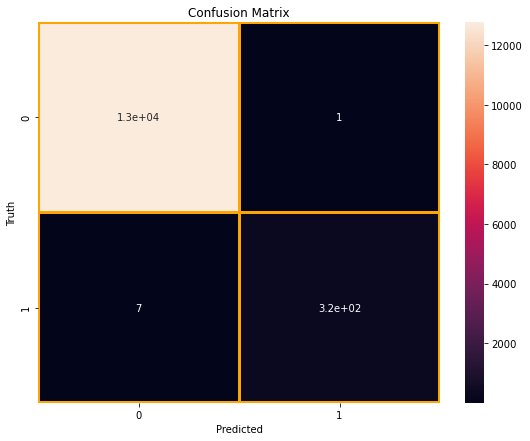

In [26]:
plt.figure(figsize=(9,7))
sns.heatmap(cm,annot=True,linewidths=2,linecolor='orange')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.title('Confusion Matrix')
plt.show()

# Deploy Model

In [26]:
!pip install ibm_watson_machine_learning

/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes


In [27]:
from ibm_watson_machine_learning import APIClient
wml_credentials = {
    'url': "https://us-south.ml.cloud.ibm.com",
    'apikey': 'zT1z5T6S4CG9SN6369lVbajORLf64sDZnN2TSMFLdxRt'
}
client=APIClient(wml_credentials)

In [28]:
def guid_from_space_name(client,space_name):
    space=client.spaces.get_details()
    return(next(item for item in space['resources'] if item['entity']["name"] == space_name)['metadata']['id'])

In [29]:
space_uid=guid_from_space_name(client,'Models')
print('Space UID = '+space_uid)

Space UID = 870d9e91-fc05-4c2c-bae5-959e6cc551af


In [30]:
client.set.default_space(space_uid)

'SUCCESS'

In [31]:
client.software_specifications.list()

-----------------------------  ------------------------------------  ----
NAME                           ASSET_ID                              TYPE
default_py3.6                  0062b8c9-8b7d-44a0-a9b9-46c416adcbd9  base
pytorch-onnx_1.3-py3.7-edt     069ea134-3346-5748-b513-49120e15d288  base
scikit-learn_0.20-py3.6        09c5a1d0-9c1e-4473-a344-eb7b665ff687  base
spark-mllib_3.0-scala_2.12     09f4cff0-90a7-5899-b9ed-1ef348aebdee  base
ai-function_0.1-py3.6          0cdb0f1e-5376-4f4d-92dd-da3b69aa9bda  base
shiny-r3.6                     0e6e79df-875e-4f24-8ae9-62dcc2148306  base
tensorflow_2.4-py3.7-horovod   1092590a-307d-563d-9b62-4eb7d64b3f22  base
pytorch_1.1-py3.6              10ac12d6-6b30-4ccd-8392-3e922c096a92  base
tensorflow_1.15-py3.6-ddl      111e41b3-de2d-5422-a4d6-bf776828c4b7  base
scikit-learn_0.22-py3.6        154010fa-5b3b-4ac1-82af-4d5ee5abbc85  base
default_r3.6                   1b70aec3-ab34-4b87-8aa0-a4a3c8296a36  base
pytorch-onnx_1.3-py3.6         1bc6029

In [32]:
software_spec_uid=client.software_specifications.get_uid_by_name('default_py3.7')
software_spec_uid

'e4429883-c883-42b6-87a8-f419d64088cd'

In [33]:
model_details=client.repository.store_model(model=lr_model,meta_props={
    client.repository.ModelMetaNames.NAME:'Predictive_Maintenance',
    client.repository.ModelMetaNames.TYPE:'scikit-learn_0.23',
    client.repository.ModelMetaNames.SOFTWARE_SPEC_UID: software_spec_uid
})

model_id=client.repository.get_model_uid(model_details)

In [34]:
model_id

'52f89543-316b-4622-850e-e51d217a3bcc'